# 1. Install and import kaggle library
Kaggle library is useful to connect to kaggle website and download datasets to local computer. 

In [1]:
!pip install kaggle

In [2]:
import kaggle

# 2. Download datasets from kaggle website using kaggle library
## 2.1. Follow below steps before using kaggle library
    1. Login to kaggle, go to settings and create new token
    2. This will download kaggle.json
    3. Now place this file to <home directory>/.kaggle folder

In [3]:
kaggle.api.authenticate()

In [4]:
kaggle.api.dataset_download_files('fivethirtyeight/uber-pickups-in-new-york-city',path='Data',quiet=False,unzip=True)

Dataset URL: https://www.kaggle.com/datasets/fivethirtyeight/uber-pickups-in-new-york-city


100%|███████████████████████████████████████████████████████████████████████████████| 109M/109M [00:01<00:00, 64.1MB/s]

## 2.2. Check the downloaded files using pathlib library

In [5]:
from pathlib import Path

In [6]:
filepath = Path('Data/')
for file in filepath.iterdir():
    print(file)

Data\other-American_B01362.csv
Data\other-Carmel_B00256.csv
Data\other-Dial7_B00887.csv
Data\other-Diplo_B01196.csv
Data\other-Federal_02216.csv
Data\other-FHV-services_jan-aug-2015.csv
Data\other-Firstclass_B01536.csv
Data\other-Highclass_B01717.csv
Data\other-Lyft_B02510.csv
Data\other-Prestige_B01338.csv
Data\other-Skyline_B00111.csv
Data\Uber-Jan-Feb-FOIL.csv
Data\uber-raw-data-apr14.csv
Data\uber-raw-data-aug14.csv
Data\uber-raw-data-janjune-15.csv
Data\uber-raw-data-jul14.csv
Data\uber-raw-data-jun14.csv
Data\uber-raw-data-may14.csv
Data\uber-raw-data-sep14.csv


## 2.3. List uber-raw files only

In [7]:
for file in filepath.glob('**/uber-raw*'):
    print(file)

Data\uber-raw-data-apr14.csv
Data\uber-raw-data-aug14.csv
Data\uber-raw-data-janjune-15.csv
Data\uber-raw-data-jul14.csv
Data\uber-raw-data-jun14.csv
Data\uber-raw-data-may14.csv
Data\uber-raw-data-sep14.csv


# 3. Import libraries

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 4. Read uber pickups data for year 2014

In [9]:
filepath = Path('Data/')
df = pd.DataFrame()
for file in filepath.glob('**/*14.csv'):
    # read data from each file and concat into one file
    print(f'Concatanating file: {file}')
    file_df = pd.read_csv(file)
    df = pd.concat([df, file_df])

Concatanating file: Data\uber-raw-data-apr14.csv
Concatanating file: Data\uber-raw-data-aug14.csv
Concatanating file: Data\uber-raw-data-jul14.csv
Concatanating file: Data\uber-raw-data-jun14.csv
Concatanating file: Data\uber-raw-data-may14.csv
Concatanating file: Data\uber-raw-data-sep14.csv


In [10]:
df.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4534327 entries, 0 to 1028135
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Date/Time  object 
 1   Lat        float64
 2   Lon        float64
 3   Base       object 
dtypes: float64(2), object(2)
memory usage: 173.0+ MB


In [12]:
df.shape

(4534327, 4)

# 5. Prepare pickup data for EDA

## 5.1. Identify and remove duplicate records

In [13]:
df.duplicated().sum()

82581

In [14]:
df.drop_duplicates(inplace=True)

In [15]:
df.shape

(4451746, 4)

## 5.2. Check null values 

In [16]:
df.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

## 5.3. Check Datatypes and correct if required

In [17]:
df.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

## 5.4. Convert the date datatype to datetime

In [18]:
df['Date/Time'] = pd.to_datetime(df['Date/Time'])

In [19]:
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

## 5.5. Create date related columns for time series analysis

In [20]:
df['Month'] = df['Date/Time'].dt.month
df['Month_name'] = df['Date/Time'].dt.month_name()
df['Day'] = df['Date/Time'].dt.day
df['Weekday'] = df['Date/Time'].dt.day_name()
df['Hour'] = df['Date/Time'].dt.hour
df['Minute'] = df['Date/Time'].dt.minute
df['Second'] = df['Date/Time'].dt.second

In [21]:
df.head()

,Date/Time,Lat,Lon,Base,Month,Month_name,Day,Weekday,Hour,Minute,Second
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,4,April,1,Tuesday,0,11,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,4,April,1,Tuesday,0,17,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,4,April,1,Tuesday,0,21,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,4,April,1,Tuesday,0,28,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,4,April,1,Tuesday,0,33,0


# 6. Exploratory Data Analysis and Visualization

## 6.1 Monthly and Weekly Pattern Analysis

### Q1. Find average trips per month.

In [22]:
round(len(df) / df['Month'].nunique(), 2)

741957.67

### Q2. Identify which month had maximum trips.

In [23]:
# Method 1 - Group by data using month_name column
df.groupby(['Month_name']).size().sort_values(ascending=False)

Month_name
September    1004099
August        813393
July          781969
June          653158
May           642360
April         556767
dtype: int64

In [24]:
df.groupby(['Month_name']).size().sort_values(ascending=False).index[0]

'September'

In [25]:
# Method 2 - Use value_counts function to fetch month wise pickup counts
df['Month_name'].value_counts()

Month_name
September    1004099
August        813393
July          781969
June          653158
May           642360
April         556767
Name: count, dtype: int64

In [26]:
df['Month_name'].value_counts().index[0]

'September'

### Q3. Plot the above data using pandas plot method

<Axes: xlabel='Month_name'>

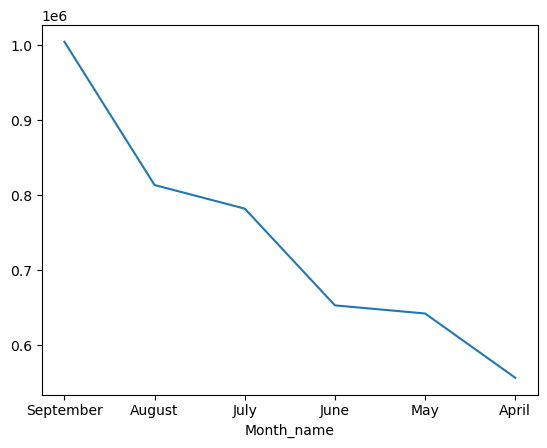

In [27]:
df['Month_name'].value_counts().plot()

### Q4. Plot the above data using pandas plot method - bar chart

<Axes: xlabel='Month_name'>

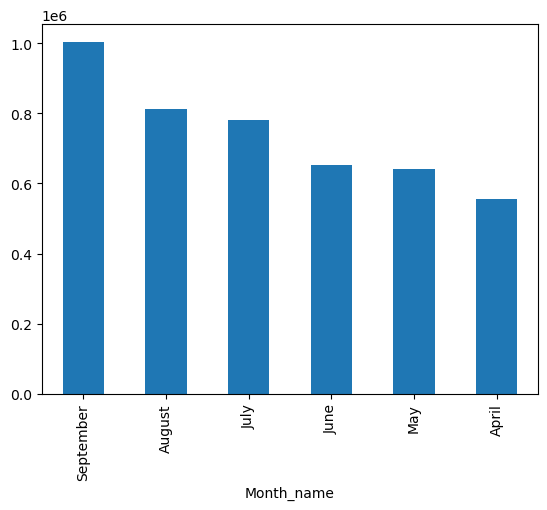

In [28]:
df['Month_name'].value_counts().plot(kind='bar')

### Q5. Plot the above data using seaborn's barplot

In [29]:
df_month_data = df['Month_name'].value_counts().to_frame()
df_month_data

,count
Month_name,
September,1004099
August,813393
July,781969
June,653158
May,642360
April,556767


<Axes: xlabel='Month_name', ylabel='count'>

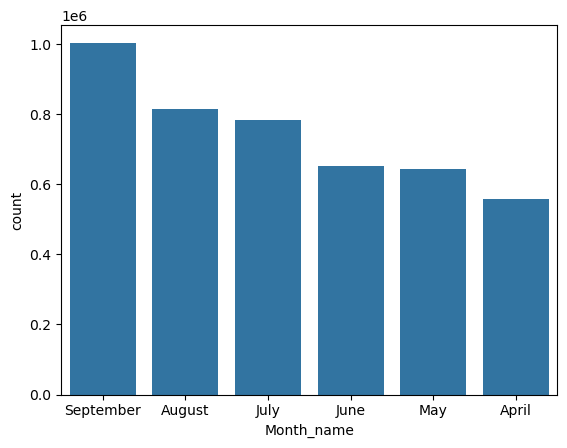

In [30]:
sns.barplot(data=df_month_data, x='Month_name', y='count')

### Q6. Identify the month and day which had the maximum number of trips overall.

In [31]:
df[['Month_name','Day']].value_counts().index[0]

('September', 13)

### Q7. Identify the day for each month which had the maximum number of trips.

In [32]:
# group data on month and day and get total pickups
df_grouped = df.groupby(['Month','Day'], as_index=False).size()

# sort the grouped data by size in descending order, partition by month and generate rank
df_grouped['Rank'] = df_grouped.sort_values('size', ascending=False).groupby('Month').cumcount()+1
df_grouped

,Month,Day,size,Rank
0,4,1,14376,25
1,4,2,17230,18
2,4,3,20482,8
3,4,4,26353,2
4,4,5,19273,14
...,...,...,...,...
178,9,26,36538,11
179,9,27,38424,7
180,9,28,28924,23
181,9,29,28478,25


In [33]:
# fetch all the records where rank = 1
df_grouped[df_grouped['Rank'] == 1]

,Month,Day,size,Rank
29,4,30,35718,1
45,5,16,32020,1
73,6,13,30704,1
113,7,23,33367,1
128,8,7,32102,1
165,9,13,42169,1


### Q8. Identify top 3 busiest days of week.

In [34]:
df['Weekday'].value_counts().head(3)

Weekday
Thursday     741372
Friday       727532
Wednesday    683604
Name: count, dtype: int64

### Q9. Plot the data using bar chart

<Axes: xlabel='Weekday'>

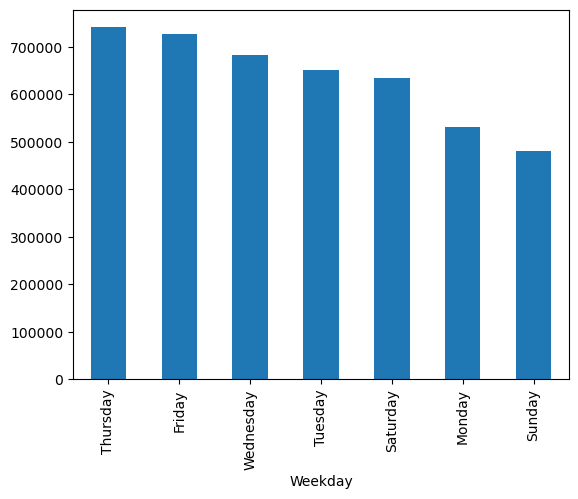

In [35]:
df['Weekday'].value_counts().plot(kind='bar')

### Q10. Analyze the number of trips by month and weekday.

In [36]:
# Method 1 - using crosstab method
df_pivot = pd.crosstab(index=df['Month_name'], columns=df['Weekday'])
df_pivot

Weekday,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
Month_name,,,,,,,
April,88985,60075,76152,50524,83954,89957,107120
August,145719,90011,129668,108168,121655,105160,113012
July,100987,91672,88626,74976,145791,134968,144949
June,103352,93261,80084,78369,113439,86706,97947
May,131880,62915,101583,55244,126919,75537,88282
September,156609,134199,158081,113877,149614,159425,132294


### Q11. Plot above data using pandas plot method

<Axes: xlabel='Month_name'>

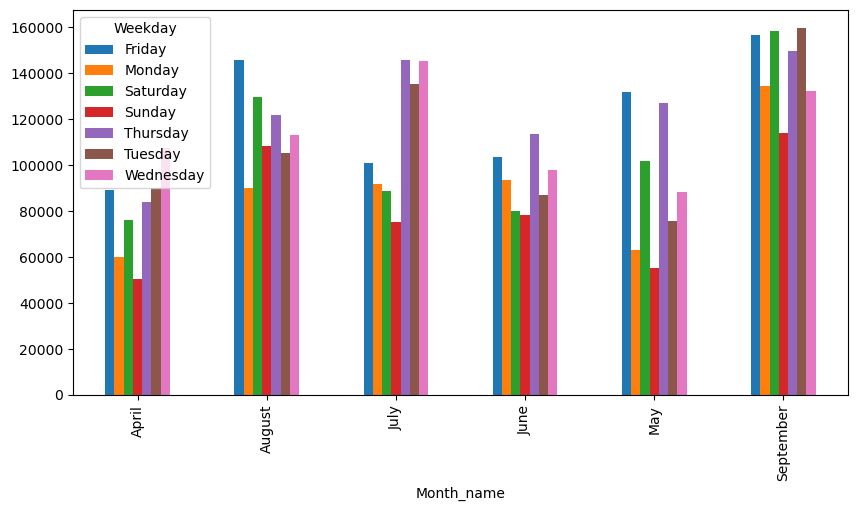

In [37]:
df_pivot.plot(kind='bar', figsize=(10,5))

In [38]:
# Method 2 - using groupby and unstack methods
# df_pivot = df.groupby(['Month_name','Day_name']).size().unstack()
# df_pivot.plot(kind='bar', figsize=(10,5))

# method 3 - using groupby and size methods
# df_pivot = df.groupby(['Month_name','Day_name'], as_index=False).size()
# sns.barplot(data=df_pivot, x='Month_name', y='size', hue='Day_name')

## 6.2. Weekday vs Weekend Analysis

### Q12. Analyze weekend vs weekday trips. Calculate total trips for weekday and weekend along with their percent contribution.

In [39]:
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
weekends = ['Saturday', 'Sunday']

In [40]:
weekday_trips = df[df['Weekday'].isin(weekdays)]
weekend_trips = df[df['Weekday'].isin(weekends)]

In [41]:
print(f"Weekday trips: {len(weekday_trips):,} ({len(weekday_trips)/len(df)*100:.1f}%)")
print(f"Weekend trips: {len(weekend_trips):,} ({len(weekend_trips)/len(df)*100:.1f}%)")

Weekday trips: 3,336,394 (74.9%)
Weekend trips: 1,115,352 (25.1%)


### Q13. Calculate average trips per day for weekend and weekdays.

In [42]:
print(f"Average weekday trips per day: {len(weekday_trips)/len(weekdays):.0f}")
print(f"Average weekend trips per day: {len(weekend_trips)/len(weekends):.0f}")

Average weekday trips per day: 667279
Average weekend trips per day: 557676


## 6.3. Hourly Pattern Analysis

### Q14. Identify top 5 busiest hours overall.

In [43]:
df['Hour'].value_counts().head()

Hour
17    330024
18    318584
16    307810
19    288836
20    279309
Name: count, dtype: int64

### Q15. Identify 5 non-peak hours.

In [44]:
df['Hour'].value_counts().tail()

Hour
5    82350
1    65913
4    54246
3    47331
2    44898
Name: count, dtype: int64

### Q16. Plot hourly pickups using bar chart.

<Axes: xlabel='Hour'>

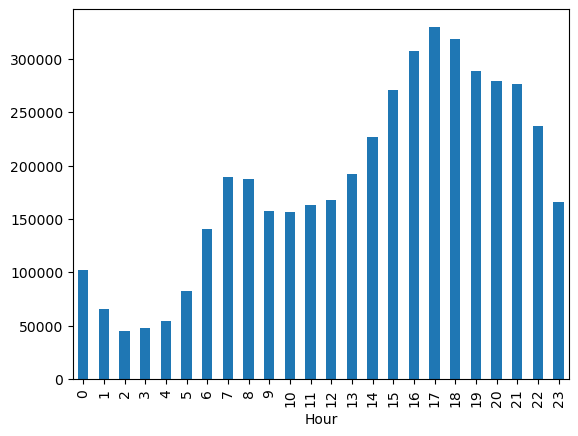

In [45]:
df['Hour'].value_counts().sort_index().plot(kind='bar')

### Q17. Analyze hourly rush in New York city by weekdays.

In [46]:
df_hourly_data = df.groupby(['Hour','Weekday'], as_index=False).size()
df_hourly_data.head(20)

,Hour,Weekday,size
0,0,Friday,13447
1,0,Monday,6327
2,0,Saturday,27096
3,0,Sunday,32275
4,0,Thursday,9116
5,0,Tuesday,6116
6,0,Wednesday,7499
7,1,Friday,8002
8,1,Monday,3679
9,1,Saturday,18783


### Q18. Plot above data using seaborn's pointplot

Text(0, 0.5, 'Number of Trips')

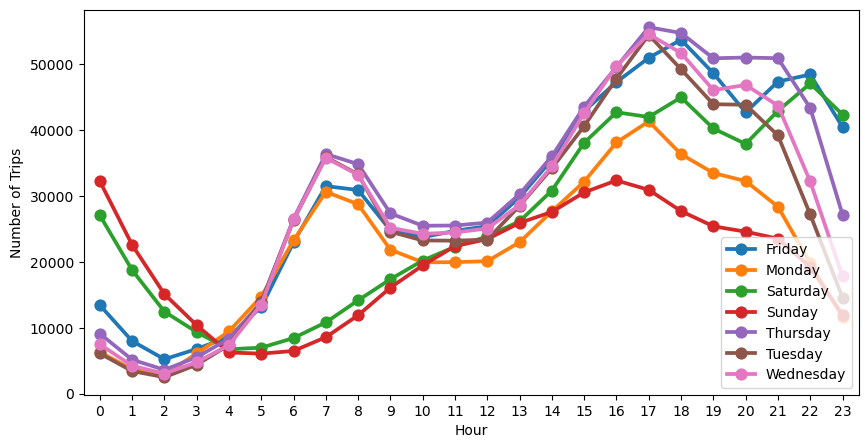

In [47]:
plt.figure(figsize=(10,5))
sns.pointplot(data=df_hourly_data, x='Hour', y='size', hue='Weekday')
plt.legend(loc=4)
plt.ylabel('Number of Trips')

# another way to display line plot using pandas plot method
# df_hourly_data = df.groupby(['Hour','Day_name']).size().unstack()
# df_hourly_data.plot()

### Q19. Perform peak hour analyis by converting hour to categorical column and calculate number of trips.

In [48]:
df['Hour_Category'] = df['Hour'].apply(lambda x: 
   'Early Morning (0-6)' if 0 <= x <= 6 else
   'Morning Rush (7-9)' if 7 <= x <= 9 else
   'Mid-Morning (10-12)' if 10 <= x <= 12 else
   'Afternoon (13-16)' if 13 <= x <= 16 else
   'Evening Rush (17-19)' if 17 <= x <= 19 else
   'Night (20-23)')

hour_category_counts = df['Hour_Category'].value_counts()
hour_category_counts

Hour_Category
Afternoon (13-16)       997386
Night (20-23)           958993
Evening Rush (17-19)    937444
Early Morning (0-6)     537213
Morning Rush (7-9)      534207
Mid-Morning (10-12)     486503
Name: count, dtype: int64

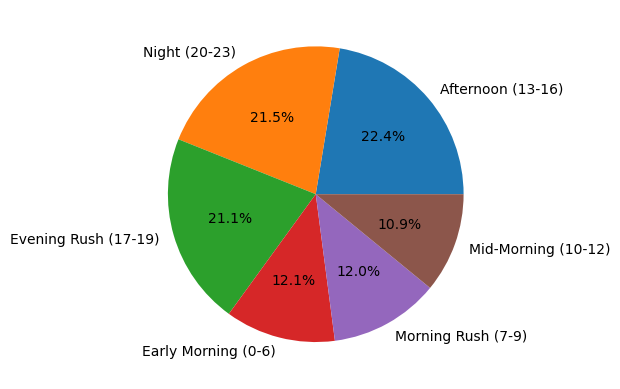

In [49]:
hour_category_counts.plot(kind='pie', autopct='%1.1f%%', startangle=0)
plt.ylabel('')
plt.show()

### Q20. Create function to analyze rush using different parameters at runtime.

In [50]:
def func(col1, col2, df):
    new_df = pd.crosstab(index=df[col1], columns=df[col2])
    return new_df

#### Analyze the rush by day and hour

<Axes: xlabel='Hour', ylabel='Day'>

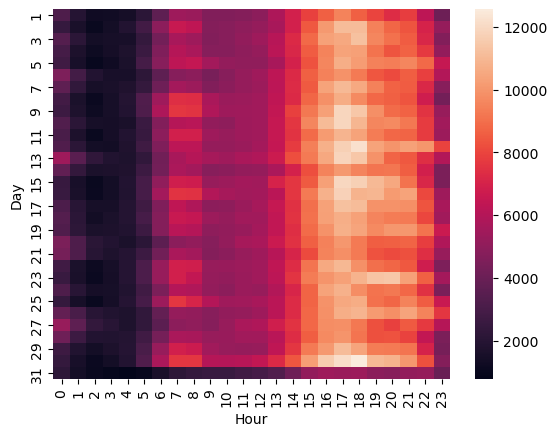

In [51]:
df_rush = func('Day', 'Hour', df)
sns.heatmap(data=df_rush)

#### Analyze the rush by weekday and hour

<Axes: xlabel='Weekday', ylabel='Hour'>

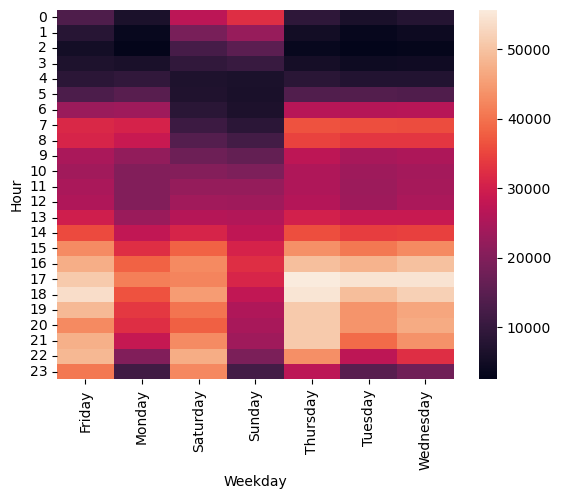

In [52]:
df_rush = func('Hour', 'Weekday', df)
sns.heatmap(data=df_rush)

#### Analyze the rush by month and weekday

<Axes: xlabel='Month_name', ylabel='Weekday'>

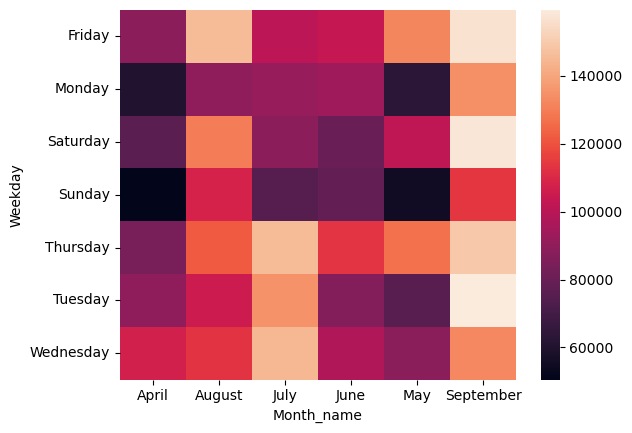

In [53]:
df_rush = func('Weekday', 'Month_name', df)
# df.style.background_gradient()
sns.heatmap(data=df_rush)

## 6.4. Geo Spatial Analysis

### Q21. Which location in New York city shows the maximum rush? Visulize the data using heatmap on world map.

In [54]:
# Group the data by longitude and latitude and fetch the count
df_lat_lon = df.groupby(['Lat','Lon'], as_index=False).size()
df_lat_lon.head()

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1


In [55]:
# Create base map using folium library
!pip install folium

In [56]:
import folium

In [57]:
world_map = folium.Map()

In [58]:
world_map

In [59]:
# Import heatmap from folium and visulize the grouped data
from folium.plugins import HeatMap

In [60]:
HeatMap(df_lat_lon).add_to(world_map)

In [61]:
world_map

## 6.5. Base Performance Analysis
### Q22. Identify most and least active base.

In [62]:
df_base_data = df['Base'].value_counts()
df_base_data

Base
B02617    1417983
B02598    1379578
B02682    1198901
B02764     254931
B02512     200353
Name: count, dtype: int64

In [63]:
# most active base
df_base_data.index[0]

'B02617'

In [64]:
# least active base
df_base_data.index[-1]

'B02512'

### Q23. Plot the base distribution using pie chart

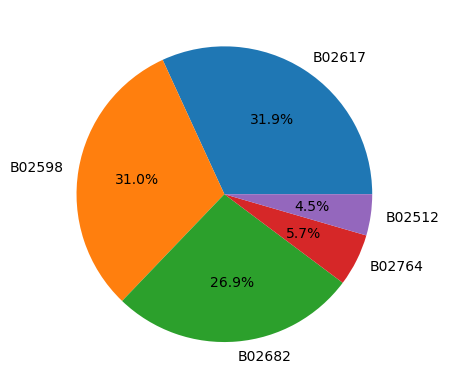

In [65]:
df_base_data.plot(kind='pie', autopct='%1.1f%%', startangle=0)
plt.ylabel('')
plt.show()

### Q24. Identify the busiest hour for each base.

In [66]:
for base in df_base_data.index[:]:
    base_data = df[df['Base'] == base]
    peak_hour = base_data['Hour'].mode()[0]
    # avg_lat = base_data['Lat'].mean()
    # avg_lon = base_data['Lon'].mean()
    print(f"  {base}: {len(base_data)} trips, Peak hour: {peak_hour}:00")

  B02617: 1417983 trips, Peak hour: 17:00
  B02598: 1379578 trips, Peak hour: 17:00
  B02682: 1198901 trips, Peak hour: 17:00
  B02764: 254931 trips, Peak hour: 18:00
  B02512: 200353 trips, Peak hour: 17:00
